# Polarized rendering

## Polarized variants

We first import the necessary packages:

In [1]:
import drjit as dr
import mitsuba as mi
import matplotlib.pyplot as plt


In [2]:
print(mi.variants())

['scalar_rgb', 'llvm_spectral_polarized', 'llvm_rgb', 'llvm_rgb_polarized', 'llvm_spectral', 'cuda_rgb', 'cuda_rgb_polarized', 'cuda_spectral', 'cuda_spectral_polarized', 'scalar_rgb_polarized', 'scalar_spectral', 'scalar_spectral_polarized']


In [3]:
mi.set_variant('cuda_rgb_polarized')

In [4]:
import os

def find_xml_files(base_path):
    # List to store the paths of the xml files
    xml_files = []

    # Walk through only the first two levels of directories
    for root, dirs, files in os.walk(base_path):
        # Since we know the structure, we can skip unwanted checks
        # Check only the directories that follow the pattern
        for dir_name in dirs:
            # Construct the expected subfolder path based on your description
            expected_path = os.path.join(root, dir_name, dir_name, 'scene_v3.xml')
            # Check if the file exists at this path
            if os.path.isfile(expected_path):
                xml_files.append(expected_path)

        # We only need to check two levels deep according to your structure
        # After the first two levels, we do not need to go deeper
        dirs[:] = []  # Clear the dirs list so os.walk does not go deeper

    return xml_files

# Base path where the folders are located
base_path = 'C:\\MI3'

# Get all xml file paths
xml_file_paths = find_xml_files(base_path)

# Print all xml file paths
# for path in xml_file_paths:
#     print(path)
# print(type(xml_file_paths[0]))

### adding stokes vector to xml file

In [5]:
import xml.etree.ElementTree as ET

def modify_integrator(xml_file_path):
    # Load the XML file
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    # Find the existing integrator element (assuming there's only one) and remove it
    existing_integrator = root.find('.//integrator')
    if existing_integrator is not None:
        root.remove(existing_integrator)

    # Create the new nested integrator structure
    new_integrator = ET.Element('integrator', attrib={'type': 'stokes'})
    nested_integrator = ET.SubElement(new_integrator, 'integrator', attrib={'type': 'volpath'})
    ET.SubElement(nested_integrator, 'integer', attrib={'name': 'max_depth', 'value': '$max_depth'})

    # Append the new integrator to the root of the XML
    root.append(new_integrator)

    # Write the updated XML back to the file
    tree.write(xml_file_path)




In [6]:
def plot_stokes_component(ax, image):
    # Convert the image into a TensorXf for manipulation
    data = mi.TensorXf(image)[:, :, 0]
    plot_minmax = 0.05 * max(dr.max(data), dr.max(-data)) # Arbitrary scale for colormap
    img = ax.imshow(data, cmap='coolwarm', vmin=-plot_minmax, vmax=+plot_minmax)
    ax.set_xticks([]); ax.set_yticks([])
    return img




### rendering the scene

In [10]:
def render_scene(path, spp = 16):
    scene = mi.load_file(path)
    print("Rendering......")
    image = mi.render(scene, spp = spp)
    print("Generating Bitmap......")
    bitmap = mi.Bitmap(image, channel_names=['R', 'G', 'B'] + scene.integrator().aov_names())
    #bitmap.write('cbox_pol_output.exr')
    channels = dict(bitmap.split())
    print("Plotting......")
    plt.figure(figsize=(15, 5))

    # Plotting S0
    plt.subplot(1, 4, 1)
    plt.imshow(channels['S0'].convert(srgb_gamma=True))
    plt.xticks([]); plt.yticks([])
    plt.xlabel("S0", size=14, weight='bold')

    # Plotting S1
    plt.subplot(1, 4, 2)
    plt.imshow(channels['S1'].convert(srgb_gamma=True))
    plt.xticks([]); plt.yticks([])
    plt.xlabel("S1", size=14, weight='bold')

    # Plotting S2
    plt.subplot(1, 4, 3)
    plt.imshow(channels['S2'].convert(srgb_gamma=True))
    plt.xticks([]); plt.yticks([])
    plt.xlabel("S2", size=14, weight='bold')

    # Plotting S3
    plt.subplot(1, 4, 4)
    plt.imshow(channels['S3'].convert(srgb_gamma=True))
    plt.xticks([]); plt.yticks([])
    plt.xlabel("S3", size=14, weight='bold')

    plt.tight_layout()
    plt.show()

    
    return



C:\MI3\glass-of-water\glass-of-water\scene_v3.xml is being processed
Rendering......
Generating Bitmap......


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Plotting......


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


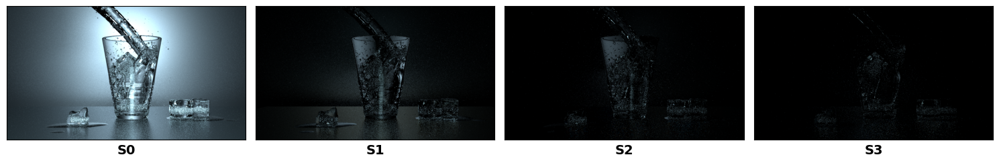

C:\MI3\teapot-full\teapot-full\scene_v3.xml is being processed
Rendering......
Generating Bitmap......


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Plotting......


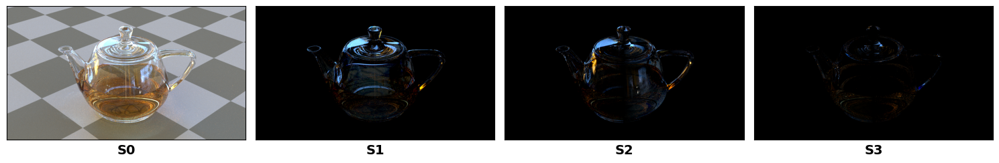

C:\MI3\veach-mis\veach-mis\scene_v3.xml is being processed
Rendering......
Generating Bitmap......


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Plotting......


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


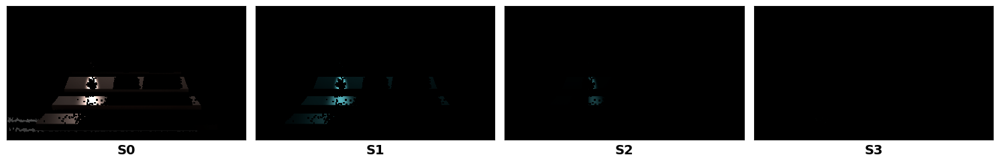

C:\MI3\volumetric-caustic\volumetric-caustic\scene_v3.xml is being processed
Rendering......
Generating Bitmap......


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Plotting......


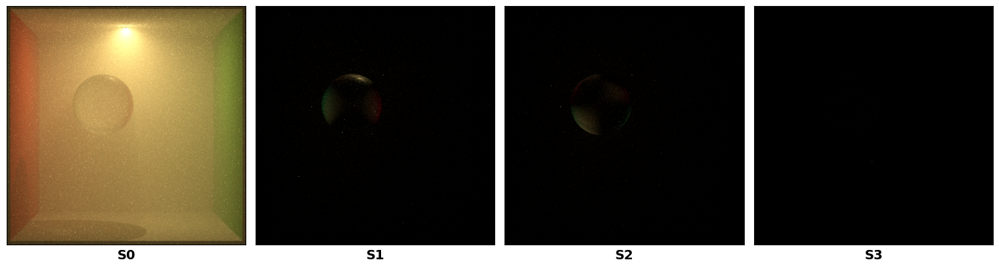

In [12]:
import numpy as np
import xml.etree.ElementTree as ET

def adjust_sensor_coordinates(xml_file_path, factor, operation):
    # Load the XML file
    tree = ET.parse(xml_file_path)
    root = tree.getroot()

    # Find the sensor element
    sensor = root.find('.//sensor[@type="perspective"]')

    # Modify the sensor's x, y, and z coordinates based on the operation
    for transform in sensor.findall('.//transform[@name="to_world"]'):
        matrix = transform.find('.//matrix')
        matrix_values = np.fromstring(matrix.attrib['value'], sep=' ')
        indices =[3]  # x, y, z coordinates in the matrix

        if operation == "multiply":
            for i in indices:
                matrix_values[i] *= factor
        elif operation == "divide":
            for i in indices:
                matrix_values[i] /= factor

        # Update the matrix attribute with new values
        matrix.attrib['value'] = " ".join(map(str, matrix_values))

    # Write the modifications back to the file
    tree.write(xml_file_path)
     

# Usage example
factor = 1.2 # Define the factor by which to adjust the coordinates


# Usage
# xml_file_path = "C:/Users/Abhishek/Downloads/classroom/classroom/scene_v3.xml"
#xml_file_path="C:/Users/Abhishek/Downloads/teapot-full/scene.xml"
#xml_file_path="C:/Users/Abhishek/Downloads/spaceship/spaceship/scene_v3.xml"
# xml_file_path = "C:/Users/Abhishek/Downloads/bathroom2/bathroom2/scene_v3.xml"
# xml_file_path = "C:/Users/Abhishek/Downloads/dragon (1)/dragon/scene_v3.xml"
indices = [10, 24, 27, 28]
for index in indices:# 0 to 14
    xml_file_path = xml_file_paths[index]
    print(xml_file_path, "is being processed")
    spp=256
    modify_integrator(xml_file_path)

    # adjust_sensor_coordinates(xml_file_path, factor, operation='multiply')
    # render_scene(xml_file_path, spp )  
    # adjust_sensor_coordinates(xml_file_path, factor, operation='divide')
   
    render_scene(xml_file_path, spp )  

    # adjust_sensor_coordinates(xml_file_path, factor, operation='divide')
    # render_scene(xml_file_path, spp )  
    # adjust_sensor_coordinates(xml_file_path, factor, operation='multiply')



C:\MI3\living-room\living-room\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


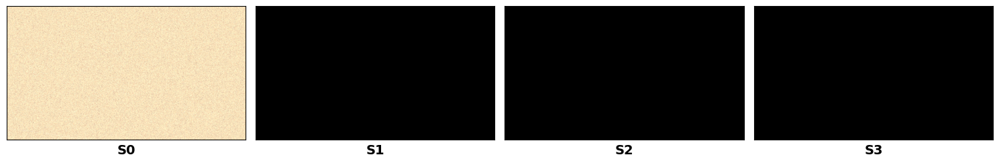

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


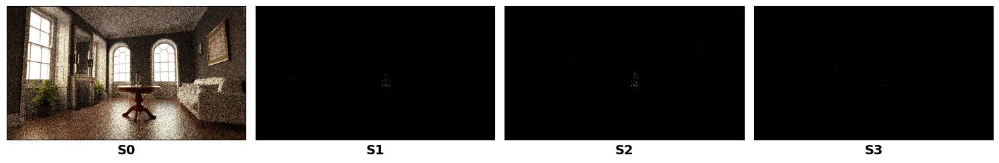

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


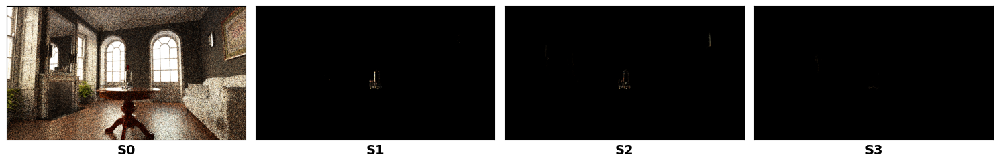

C:\MI3\living-room-2\living-room-2\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


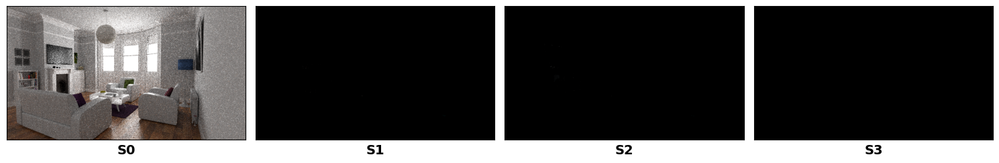

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


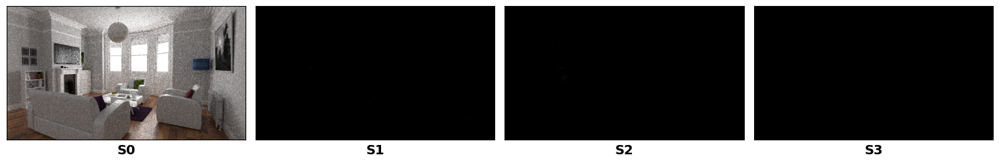

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


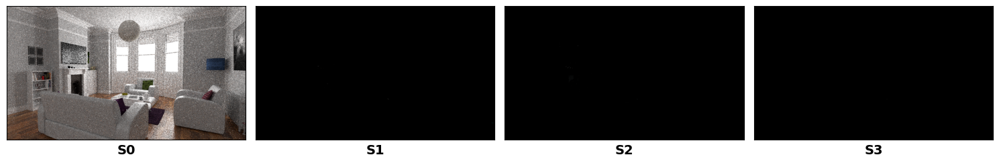

C:\MI3\living-room-3\living-room-3\scene_v3.xml is being processed


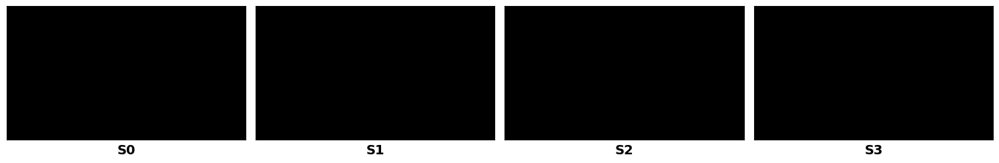

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


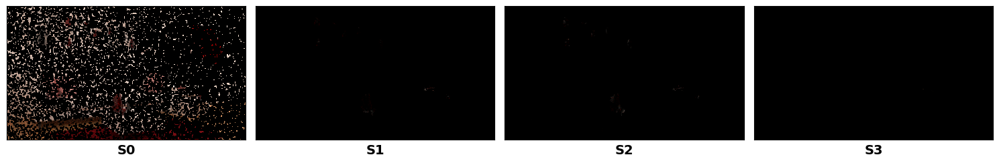

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


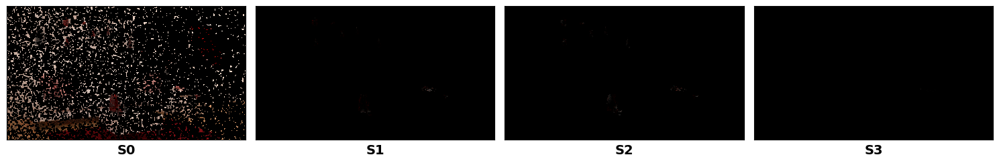

C:\MI3\matpreview\matpreview\scene_v3.xml is being processed


AttributeError: 'NoneType' object has no attribute 'attrib'

In [ ]:
for xml_file_path in xml_file_paths[15:18]:
    print(xml_file_path, "is being processed")
    spp=4
    modify_integrator(xml_file_path)

    adjust_sensor_coordinates(xml_file_path, factor, operation='multiply')
    render_scene(xml_file_path, spp )  
    adjust_sensor_coordinates(xml_file_path, factor, operation='divide')

    render_scene(xml_file_path, spp )  

    adjust_sensor_coordinates(xml_file_path, factor, operation='divide')
    render_scene(xml_file_path, spp )  
    adjust_sensor_coordinates(xml_file_path, factor, operation='multiply')

C:\MI3\spaceship\spaceship\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


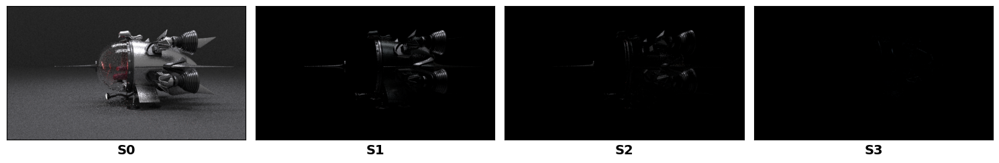

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


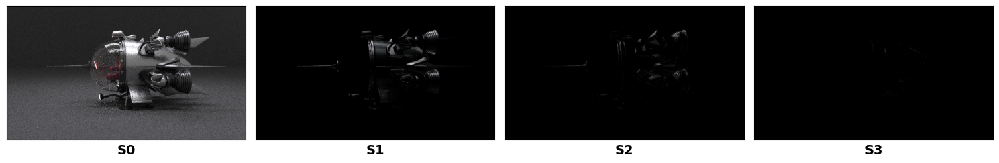

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


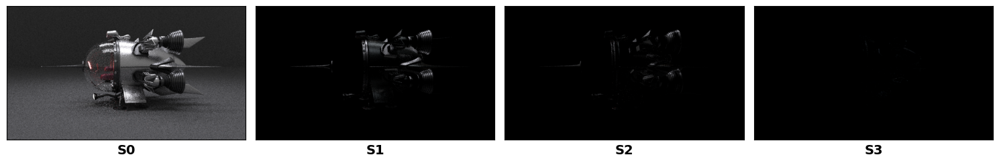

C:\MI3\staircase\staircase\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


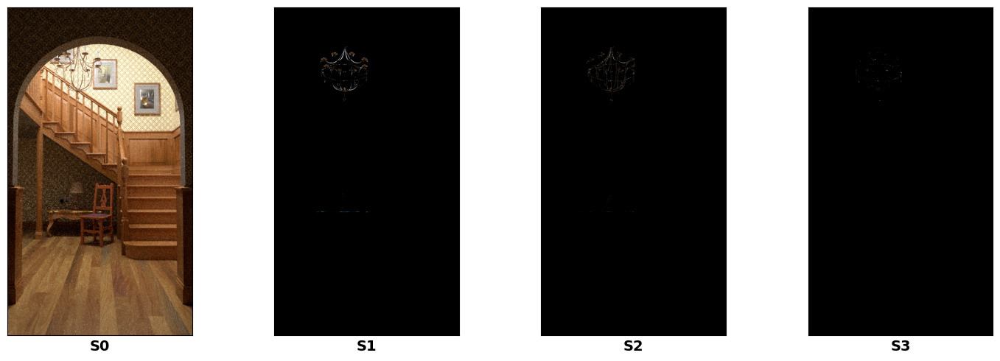

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


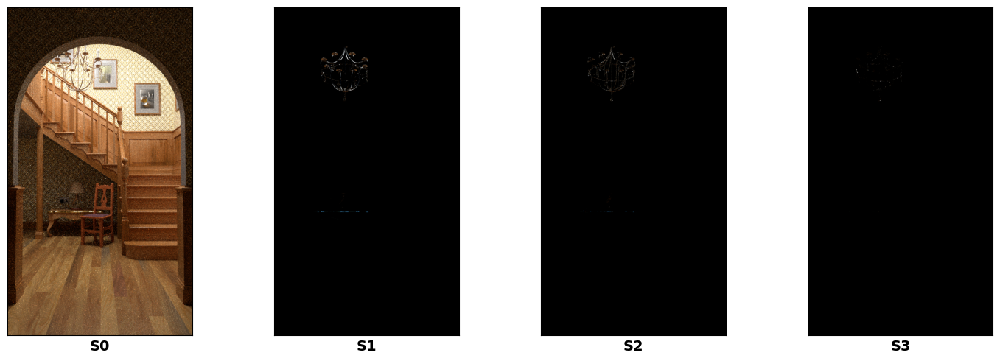

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


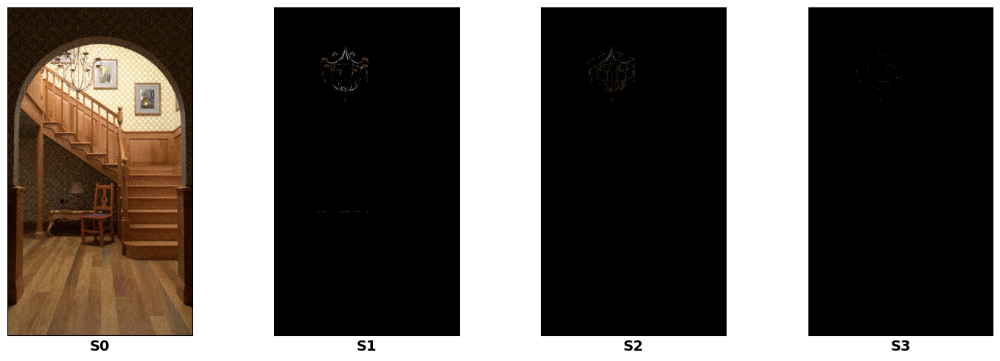

C:\MI3\staircase2\staircase2\scene_v3.xml is being processed


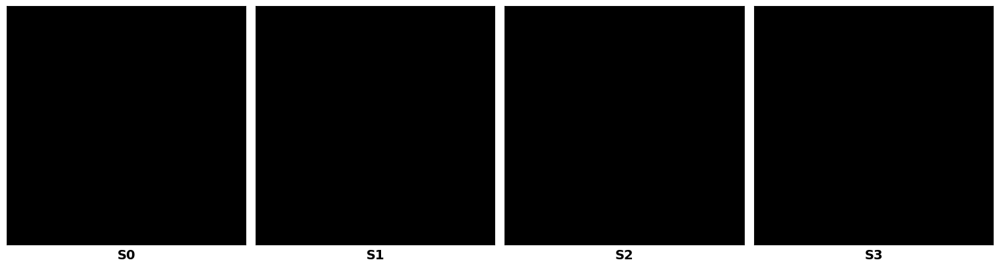

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


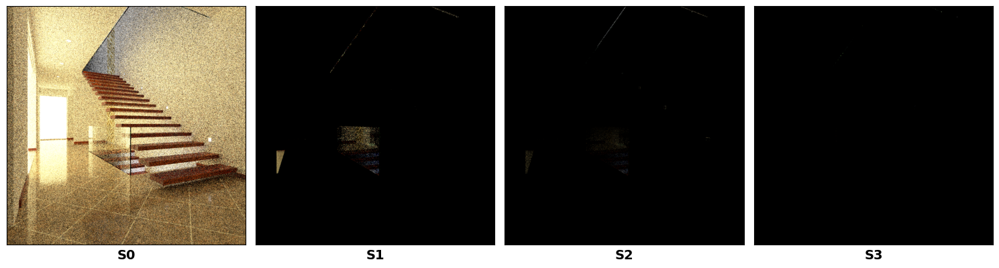

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


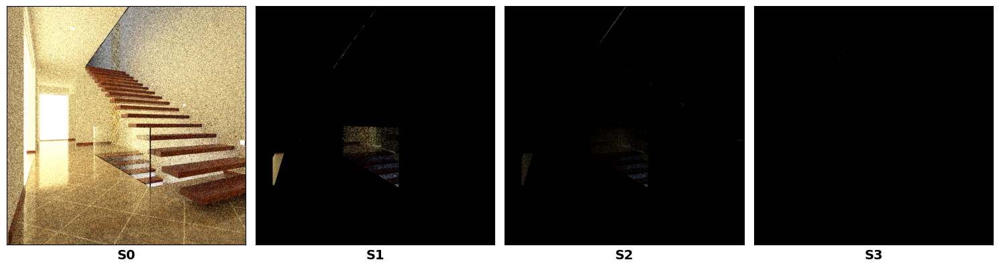

C:\MI3\teapot\teapot\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


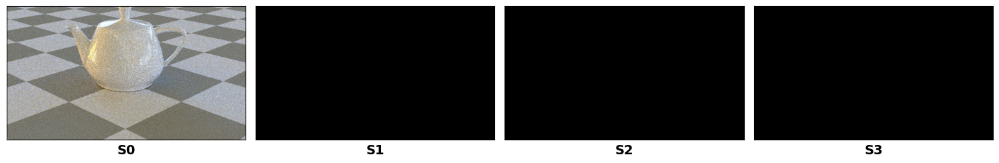

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


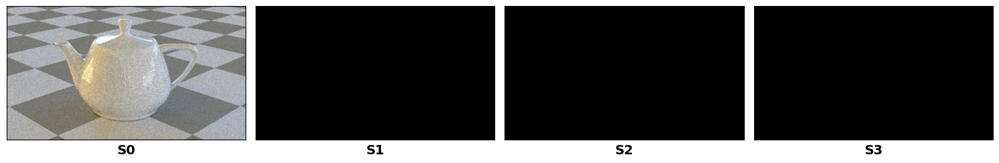

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


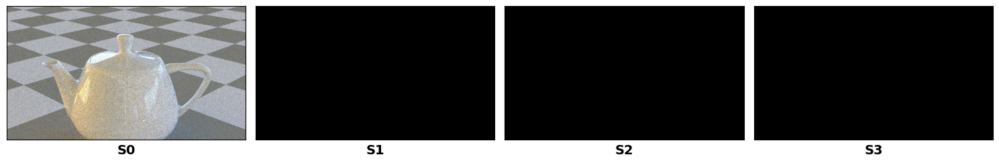

C:\MI3\teapot-full\teapot-full\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


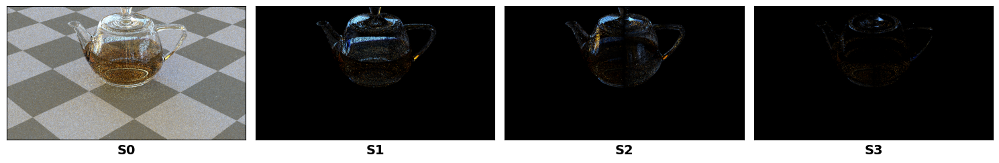

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


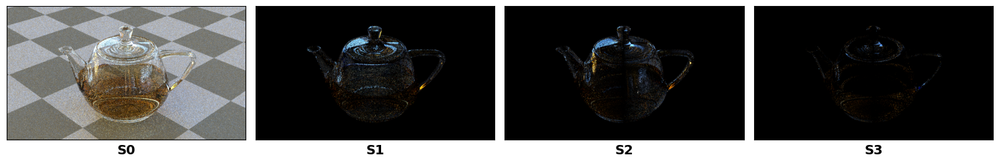

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


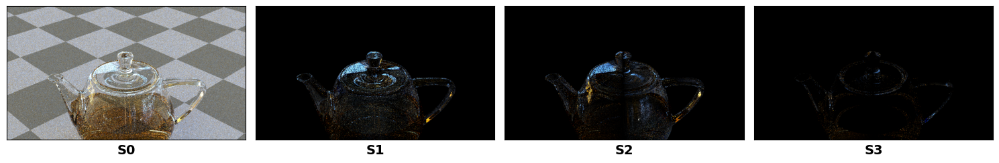

C:\MI3\veach-ajar\veach-ajar\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


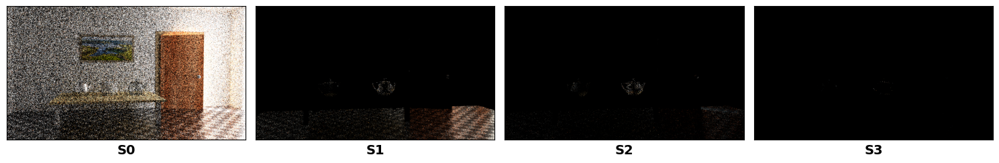

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


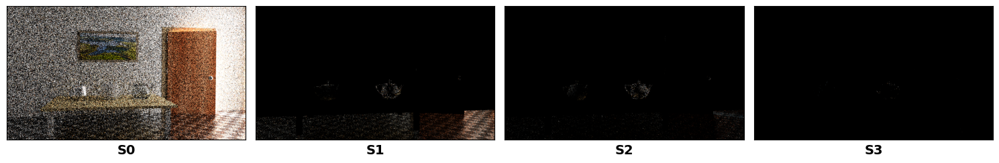

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


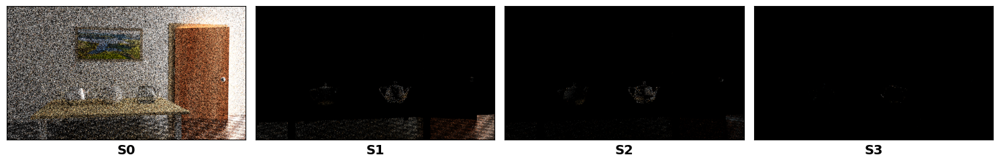

C:\MI3\veach-bidir\veach-bidir\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


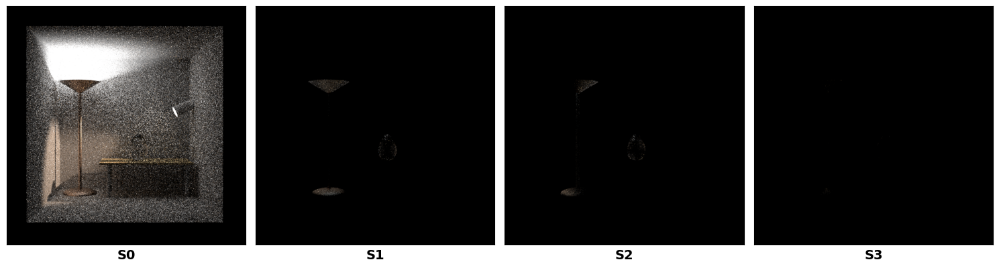

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


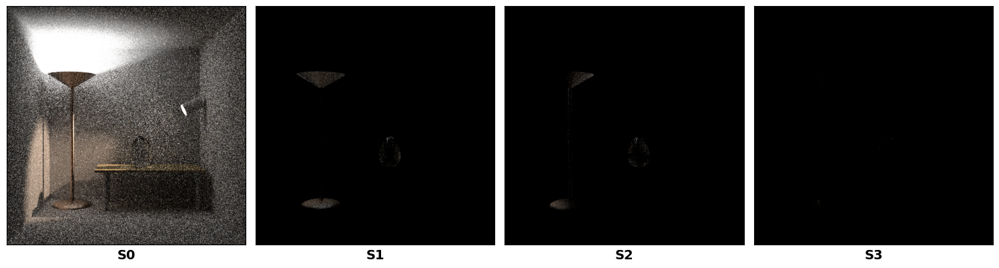

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


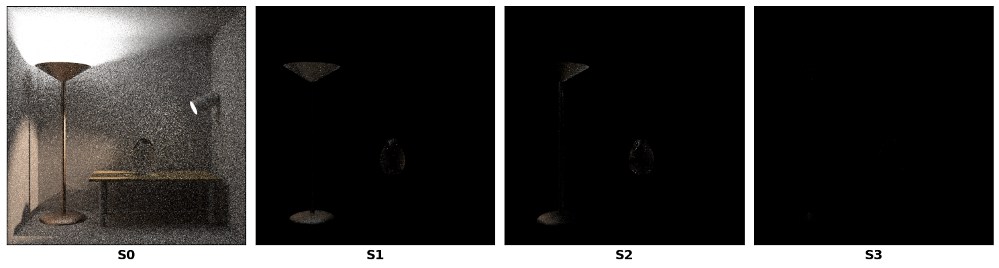

C:\MI3\veach-mis\veach-mis\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


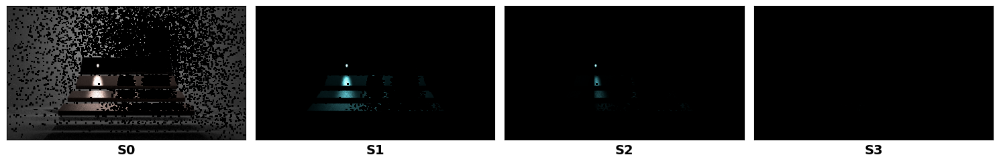

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


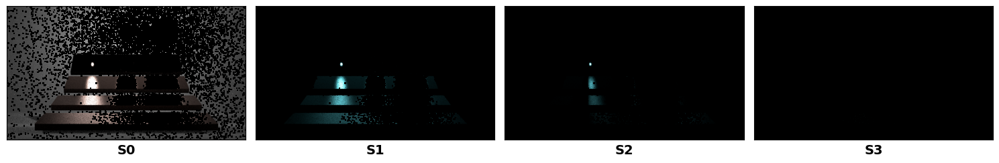

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


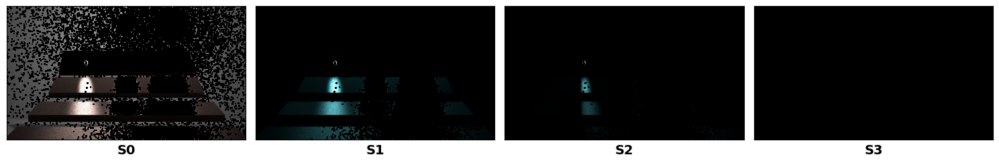

C:\MI3\volumetric-caustic\volumetric-caustic\scene_v3.xml is being processed


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


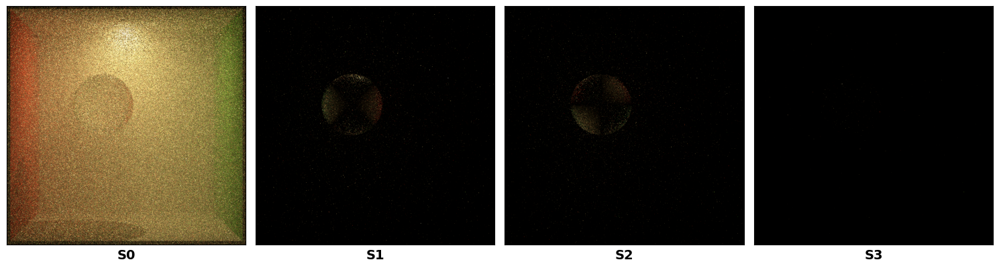

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


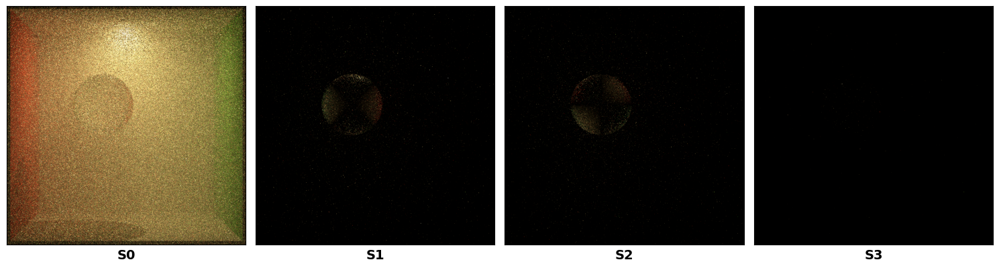

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


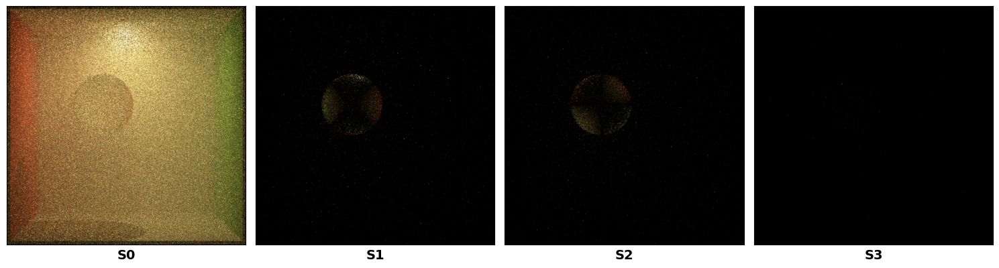

In [28]:
for xml_file_path in xml_file_paths[20:]:
    print(xml_file_path, "is being processed")
    spp=4
    modify_integrator(xml_file_path)

    adjust_sensor_coordinates(xml_file_path, factor, operation='multiply')
    render_scene(xml_file_path, spp )  
    adjust_sensor_coordinates(xml_file_path, factor, operation='divide')

    render_scene(xml_file_path, spp )  

    adjust_sensor_coordinates(xml_file_path, factor, operation='divide')
    render_scene(xml_file_path, spp )  
    adjust_sensor_coordinates(xml_file_path, factor, operation='multiply')

In [100]:
scene = mi.load_file("C:/Users/Abhishek/Downloads/teapot-full/scene.xml")

## Rendering

We're now ready to render the image. In this example, we use many samples as the scene contains many specular interactions that are challenging for a
path tracing algorithm to render.

In [101]:
image = mi.render(scene, spp=32)
image

TensorXf(shape=(720, 1280, 15))

In [102]:
bitmap = mi.Bitmap(image, channel_names=['R', 'G', 'B'] + scene.integrator().aov_names())
#bitmap.write('cbox_pol_output.exr')
print(bitmap)

Bitmap[
  pixel_format = multichannel,
  component_format = float32,
  size = [1280, 720],
  srgb_gamma = 0,
  struct = Struct<60>[
    float32 R; // @0, premultiplied alpha
    float32 G; // @4, premultiplied alpha
    float32 B; // @8, premultiplied alpha
    float32 S0.R; // @12, premultiplied alpha
    float32 S0.G; // @16, premultiplied alpha
    float32 S0.B; // @20, premultiplied alpha
    float32 S1.R; // @24, premultiplied alpha
    float32 S1.G; // @28, premultiplied alpha
    float32 S1.B; // @32, premultiplied alpha
    float32 S2.R; // @36, premultiplied alpha
    float32 S2.G; // @40, premultiplied alpha
    float32 S2.B; // @44, premultiplied alpha
    float32 S3.R; // @48, premultiplied alpha
    float32 S3.G; // @52, premultiplied alpha
    float32 S3.B; // @56, premultiplied alpha
  ],
  data = [ 52.7 MiB of image data ]
]



```

This particular Bitmap has 15 (!) channels with the following meanings:

* (**0-3**): The normal color (RGB) (optional  alpha (A) channel if requested).
* (**4-6**): Stokes vector component "0", encoding the intensity of the image, i.e. copy of channels 0-2.
* (**7-9**): Stokes vector component "1", encoding horizontal vs. vertical linear polarization as an RGB image.
* (**10-12**): Stokes vector component "2", encoding diagonal linear polarization as an RGB image.
* (**13-15**): Stokes vector component "3", encoding right vs. left circular polarization as an RGB image.

Note that the R, G, and B channels will always be copies of each other in this example as we chose uniform spectra for all materials.

## Visualization

A suitable image viewer, such as [TEV][1], can be used to inspect the written .exr file. To read the file in again using the Mitsuba Python bindings, we can split the multichannel bitmap image into a list of 3-channel `Bitmap`s using the [<code>split()</code>][2] method.

[1]: https://github.com/Tom94/tev
[2]: https://mitsuba.readthedocs.io/en/latest/src/api_reference.html#mitsuba.Bitmap.split

In [103]:
channels = dict(bitmap.split())
print(channels['S0'])
print(channels.keys())

# a=dict(channels['S0'].split())
# print(a.keys())

Bitmap[
  pixel_format = rgb,
  component_format = float32,
  size = [1280, 720],
  srgb_gamma = 0,
  struct = Struct<12>[
    float32 R; // @0, premultiplied alpha
    float32 G; // @4, premultiplied alpha
    float32 B; // @8, premultiplied alpha
  ],
  data = [ 10.5 MiB of image data ]
]
dict_keys(['<root>', 'S0', 'S1', 'S2', 'S3'])


For the three Stokes vector components that encode the polarization state, we use a divergent colormap (`coolwarm`) as there are both positive and negative values to be displayed.

---